**VISUAL INFORMATION PROCESSING AND MANAGEMENT PROJECT**

Authors:
* Biasco Anna Marika      mat. 865873
* Pulerà Francesca        mat. 870005
* Zarantonello Massimo    mat. 866457

# Introduzione - Seconda parte

Questo secondo notebook riguarda la seconda fase del progetto, ovvero il miglioramento di un dataset degradato. Supponiamo di trovarci in una situazione in cui disponiamo di un insieme di immagini compromesse da rumore. L'obiettivo è ottimizzare la capacità di classificazione, sia migliorando la qualità dei dati a disposizione, sia allenando il classificatore su dati affetti da degradazione.



Per prima cosa, conduciamo un'analisi del dataset degradato per comprendere la natura del rumore presente e valutare l'impatto sulle immagini. Questo passaggio è fondamentale per definire le strategie più adeguate.

## Analisi del dataset degradato

Di seguito alcune funzioni utilizzate nella prima parte del progetto

In [1]:
# importazioni
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import seaborn as sns
import random

In [4]:
# Funzione per mostrare un campione di immagini
def show_sample_images(df, dataset_path, sample_size=10):
    sample_size = min(sample_size, len(df))
    plt.figure(figsize=(15, 10))

    for i, (_, row) in enumerate(df.sample(sample_size).iterrows()):
        img_name = row['image']  # Colonna che contiene il nome del file immagine
        label = row['class_name']     # Colonna che contiene la classe/etichetta

        img_path = os.path.join(dataset_path, img_name)
        img = Image.open(img_path)

        # Mostra l'immagine
        plt.subplot(4, 5, i + 1)  # Un massimo di 20 immagini mostrate (4x5 griglia)
        plt.imshow(img)
        plt.axis('off')
        plt.title(label)

    plt.tight_layout()
    plt.show()

In [5]:
# Funzione per visualizzare n immagini di una classe
def show_class_images(df, dataset_path, class_label, sample_size=5):
    plt.figure(figsize=(15, 10))

    # Seleziona solo le immagini della classe 0
    class_images = df[df['label'] == class_label]['image'].tolist()

    class_name = df[df['label'] == class_label]['class_name'].iloc[0]

    # Seleziona un campione casuale di 5 immagini dalla classe
    sample_images = random.sample(class_images, sample_size)

    # Visualizza le immagini
    for index, img_name in enumerate(sample_images, 1):
        img_path = os.path.join(dataset_path, img_name)
        img = Image.open(img_path)

        plt.subplot(1, sample_size, index)
        plt.imshow(img)
        plt.axis('off')
        plt.title(class_name)

    plt.tight_layout()
    plt.show()

In [6]:
# Funzione per esplorare il dataset
def explore_dataset(path, description):
    """
    Esplora un dataset e riporta:
    - Numero totale di immagini
    - Dimensioni medie e range
    - Numero di classi presenti (se applicabile)

    Args:
        path (str): percorso della directory del dataset
        description (str): breve descrizione del dataset
    """
    print(f"\nAnalisi del {description}")
    images = os.listdir(path)
    print(f"- Numero totale di immagini: {len(images)}")

    # Analisi delle dimensioni delle immagini
    sizes = []
    for image_file in images:
        try:
            with Image.open(os.path.join(path, image_file)) as img:
                sizes.append(img.size)
        except Exception as e:
            print(f"Errore con {image_file}: {e}")

    if sizes:
        widths, heights = zip(*sizes)
        print(f"- Dimensioni medie delle immagini: {sum(widths)/len(widths):.2f}x{sum(heights)/len(heights):.2f}")
        print(f"- Range dimensioni: larghezza ({min(widths)}-{max(widths)}), altezza ({min(heights)}-{max(heights)})")

In [10]:
path_degraded = '/Users/annamarika/Desktop/val_set_degraded'
labels_val_path = '/Users/annamarika/PycharmProjects/VisualFoodRecognitionProject/ground_truth/my_val_info.csv'

In [12]:
# Leggiamo il file CSV
val_degenerato = pd.read_csv(labels_val_path, delimiter=",", header=None, names=["image", "label"])

# Mostriamo gli ultimi 5 record
print(val_degenerato.tail())

                image  label
11910  val_010317.jpg     13
11911  val_010318.jpg    172
11912  val_010319.jpg     72
11913  val_010320.jpg    124
11914  val_010321.jpg    109


In [19]:
labels_name_path = "/Users/annamarika/PycharmProjects/VisualFoodRecognitionProject/ground_truth/labels.txt"

In [20]:
# Carichiamo i nomi dei piatti (classe)
with open(labels_name_path, 'r') as file:
    class_names = file.readlines()

class_names = [name.split(' ', 1)[1].strip() for name in class_names]

print(len(class_names))

251


In [21]:
val_degenerato['class_name'] = val_degenerato['label'].apply(lambda x: class_names[x])

# Ora 'train_labeled' conterrà una colonna 'class_name' con il nome dei piatti
print(val_degenerato.head())

            image  label           class_name
0  val_010323.jpg    247          eccles_cake
1  val_010324.jpg    234               pirogi
2  val_010325.jpg    222      chicken_marengo
3  val_010326.jpg    240  barbecued_spareribs
4  val_010327.jpg    218               huitre


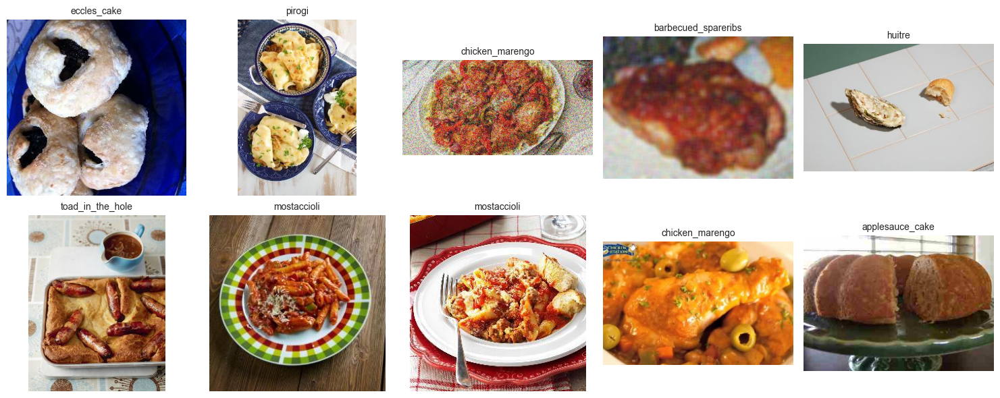

In [24]:
# Visualizziamo un esempio delle prime 10 immagini con il nome del piatto
fig, ax = plt.subplots(2, 5, figsize=(15, 6))

for idx, (img_path, label, class_name) in enumerate(val_degenerato.head(10).values):
    img = plt.imread(path_degraded + '/' + img_path)
    ax[idx//5, idx%5].imshow(img)
    ax[idx//5, idx%5].set_title(class_name, fontsize=10)
    ax[idx//5, idx%5].axis('off')

plt.tight_layout()
plt.show()

Non tutte le immagini risultano affette da rumore; tuttavia, ad esempio, la terza immagine presenta rumore di tipo salt and pepper. Proviamo a mostrare 10 immagini randomiche

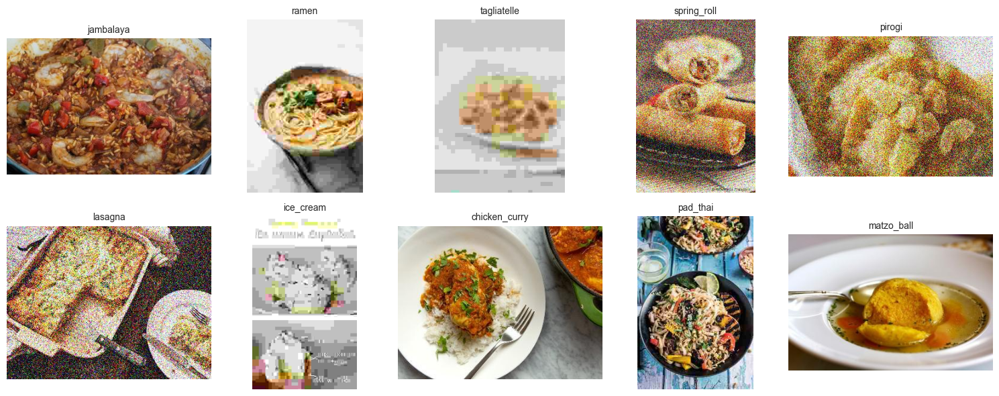

In [25]:
import random

# Seleziona casualmente 10 immagini dal dataset
random_samples = val_degenerato.sample(10, random_state=42).values

fig, ax = plt.subplots(2, 5, figsize=(15, 6))

for idx, (img_path, label, class_name) in enumerate(random_samples):
    img = plt.imread(path_degraded + '/' + img_path)
    ax[idx//5, idx%5].imshow(img)
    ax[idx//5, idx%5].set_title(class_name, fontsize=10)
    ax[idx//5, idx%5].axis('off')

plt.tight_layout()
plt.show()


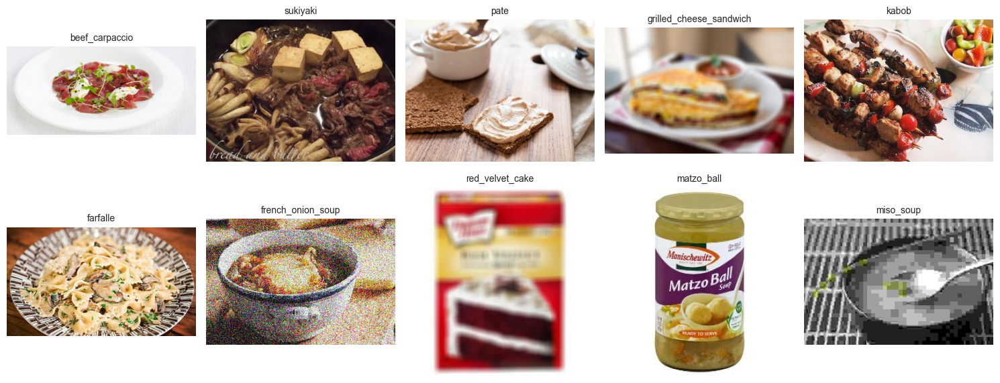

In [26]:
import random

# Seleziona casualmente 10 immagini dal dataset
random_samples = val_degenerato.sample(10, random_state=8).values

fig, ax = plt.subplots(2, 5, figsize=(15, 6))

for idx, (img_path, label, class_name) in enumerate(random_samples):
    img = plt.imread(path_degraded + '/' + img_path)
    ax[idx//5, idx%5].imshow(img)
    ax[idx//5, idx%5].set_title(class_name, fontsize=10)
    ax[idx//5, idx%5].axis('off')

plt.tight_layout()
plt.show()


Anche analizzando queste ulteriori 20 immagini selezionate casualmente, è possibile distinguere diversi tipi di rumore, tra cui *salt and pepper*, *sfocatura* e problemi di risoluzione, probabilmente causati da un processo di *compressione JPEG*.

## Analisi delle metriche di valutazione

Poiché è noto che il dataset di validazione degradato corrisponde esattamente al set di validazione originale con l'aggiunta di rumore, analizziamo alcune metriche sui due dataset per identificare eventuali valori di riferimento utili a distinguere le immagini degradate da quelle non degradate.

In un caso reale, questo esperimento sarebbe facilmente replicabile applicando artificialmente del rumore a un insieme di immagini.

Calcoliamo alcune metriche per ogni immagine, sull'immagine convertita in scala di grigi focalizzandosi sulle variazioni di intensità luminosa:

- **laplacian_variance**: Viene applicato l'operatore Laplaciano all'immagine in scala di grigi L'operatore Laplaciano calcola la seconda derivata dell'immagine, evidenziando le aree con variazioni rapide di intensità, che corrispondono tipicamente ai bordi.
Viene calcolata la varianza dei valori dell'immagine Laplaciana ottenuta al passaggio precedente. La varianza misura la dispersione dei valori: una varianza elevata indica una maggiore diversità nei valori dei pixel, tipica di un'immagine nitida con bordi ben definiti; una varianza bassa suggerisce una minore diversità, caratteristica di un'immagine sfocata. Questo metodo è comunemente utilizzato per determinare il livello di sfocatura di un'immagine.

- **gradient_mean**: Viene applicato l'operatore Sobel all'immagine per calcolare il gradiente in direzione orizzontale (asse x). La funzione `cv2.Sobel()` della libreria OpenCV calcola la derivata prima dell'immagine.
I parametri 1 e 0 indicano rispettivamente che la derivata viene calcolata rispetto all'asse x e non all'asse y, e viceversa per i valori 0 e 1. Il parametro `ksize=5` specifica la dimensione del kernel Sobel utilizzato per l'operazione di convoluzione; un valore maggiore di `ksize` implica una maggiore sensibilità ai dettagli dell'immagine.
Poi viene calcolata la magnitudine del gradiente combinando i gradienti orizzontali e verticali. La magnitudine del gradiente in ogni punto dell'immagine è ottenuta come la radice quadrata della somma dei quadrati dei gradienti orizzontale e verticale. Questo valore rappresenta l'intensità del cambiamento di luminosità in quel punto, evidenziando i bordi e le transizioni nell'immagine.

- **Mean gradient magnitude of the Sobel gradients**: Viene, inoltre, calcolata la media dei valori della magnitudine del gradiente su tutta l'immagine. Un valore medio elevato indica che l'immagine ha numerosi cambiamenti di intensità.

- **gradient_std**: Viene calcolata la deviazione standard della magnitudine del gradiente. La deviazione standard misura la dispersione dei valori attorno alla media; una deviazione standard elevata indica una maggiore variazione nei valori del gradiente, associata a immagini più definite.

- La metrica **gdf_entropy** rappresenta l'entropia della Funzione di Distribuzione del Gradiente (GDF) di un'immagine. L'entropia, in questo contesto, misura il grado di incertezza o di disordine presente nella distribuzione dei gradienti dell'immagine. Un'entropia elevata indica una distribuzione dei gradienti più uniforme, suggerendo una maggiore complessità e dettaglio nell'immagine, mentre un'entropia bassa indica una distribuzione più concentrata, associata a immagini più uniformi o sfocate (sfruttando i gradienti calcolati nel punto precedente)- Vine creato un istogramma della magnitudine del gradiente e viene normalizzato. Questo processo trasforma l'istogramma in una funzione di distribuzione di probabilità, dove la somma di tutte le probabilità è pari a 1. L'entropia della GDF viene calcolata utilizzando la formula dell'entropia di Shannon.

 - la funzione `calculate_extreme_pixel`: La funzione calculate_extreme_pixel calcola la percentuale di pixel in un'immagine che si trovano vicino ai valori estremi di intensità, definiti da due soglie: una inferiore (lower_threshold) e una superiore (upper_threshold). Questi valori estremi corrispondono ai pixel molto scuri (vicini al nero) e molto chiari (vicini al bianco).

- **MAD**: calcola la deviazione standard assoluta che è una misura la dispersione dei valori dei pixel rispetto all'intensità media. Si tratta di una misura di dispersione che indica quanto i valori dei pixel si discostano in media dall'intensità media dell'immagine. Una MAD elevata indica una maggiore variabilità nei valori dei pixel, mentre una MAD bassa suggerisce che i valori dei pixel sono concentrati attorno all'intensità media.

- La funzione kurtosis di SciPy calcola la **curtosi** di un dataset, una misura statistica che descrive la "coda" della distribuzione dei dati. La curtosi indica quanto le code della distribuzione siano pesanti rispetto a una distribuzione normale. Nell'ambito dell'analisi delle immagini, la curtosi può essere utilizzata per valutare la distribuzione dei valori di intensità dei pixel.

- **Varianza delle intensità dei pixel**: Infine abbiamo calcolato la varianza dei valori dei pixel
- **Rapporto Segnale/Rumore (SNR)**: calcola la potenza del segnale come il quadrato dell'intensità media.calcola il rapporto segnale/rumore in decibel (dB). La formula `10 * log10(signal_power / noise_power)` è comunemente utilizzata per esprimere il rapporto segnale/rumore in dB.  Un SNR elevato indica che l'immagine contiene una quantità significativa di segnale rispetto al rumore, risultando quindi più chiara e dettagliata.


In [27]:
import cv2
import numpy as np
from PIL import Image
from scipy.stats import kurtosis

In [29]:
def calculate_extreme_pixel(image_array, lower_threshold=30, upper_threshold=225):
    close_to_black = image_array < lower_threshold
    close_to_white = image_array > upper_threshold

    black_pixel_count = np.sum(close_to_black)
    white_pixel_count = np.sum(close_to_white)
    total_pixels = image_array.size
    extreme_pixel_percentage = ((black_pixel_count + white_pixel_count) / total_pixels)

    return extreme_pixel_percentage

In [30]:
def detect_noises(image: Image.Image):
    """
    Analyzes various noise-related metrics in a grayscale image and returns a dictionary
    containing measures of image sharpness, intensity distribution, and other statistical
    properties. This function employs various techniques such as Laplacian variance, gradient
    analysis, kurtosis, and signal-to-noise ratio to provide robust measures of noise and
    image quality.

    Args:
        image (Image.Image): Input image to analyze. Must be a PIL Image object.

    Raises:
        ValueError: If the input image is None or cannot be read.

    Returns:
        dict: A dictionary containing the following noise and image quality metrics:
            - laplacian_variance: Variance of the Laplacian of the image.
            - gradient_mean: Mean gradient magnitude of the Sobel gradients.
            - gradient_std: Standard deviation of the gradient magnitude.
            - gdf_entropy: Entropy of the Gradient Distribution Function (GDF).
            - extreme_pixel: Percentage of extreme pixels (intensity close to 0 or 255).
            - mad: Mean Absolute Deviation of the pixel intensities.
            - kurt: Kurtosis of the pixel intensity distribution.
            - variance: Variance of the pixel intensities.
            - snr: Signal-to-Noise Ratio (SNR) in decibels (dB).
    """
    if image is None:
        raise ValueError("Could not open or find the image.")

    image = np.array(image.convert('L'))

    # 1. Laplacian variance method
    laplacian = cv2.Laplacian(image, cv2.CV_64F)
    laplacian_var = laplacian.var()

    # 2. Gradient-based sharpness calculation
    sobelx = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=5)
    sobely = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=5)
    gradient_magnitude = np.sqrt(sobelx ** 2 + sobely ** 2)
    gradient_mean = np.mean(gradient_magnitude)
    gradient_std = np.std(gradient_magnitude)

    # 3. Gradient Distribution Function (GDF)
    hist, _ = np.histogram(gradient_magnitude, bins=50, range=(0, np.max(gradient_magnitude)))
    gdf = hist / np.sum(hist)  # Normalize to create a distribution function
    gdf_entropy = -np.sum(gdf * np.log2(gdf + 1e-10))  # Entropy of GDF

    # 4. calculate the percentage of pixels in the image that have intensity values
    #     very close to 0 (black) or 255 (white)
    extreme_pixels = calculate_extreme_pixel(image)
    # 5. Kurtosis and MAD
    pixel_values = image.flatten()
    mean_intensity = np.mean(pixel_values)
    mad = np.mean(np.abs(pixel_values - mean_intensity))

    kurt = kurtosis(pixel_values, fisher=False)
    # 6. Variance of pixel intensities
    variance = np.var(pixel_values)

    # 7. Signal-to-Noise Ratio (SNR)
    signal_power = mean_intensity ** 2
    snr = 10 * np.log10(signal_power / (variance + 1e-10))

    return {
        "laplacian_variance": laplacian_var,
        "gradient_mean": gradient_mean,
        "gradient_std": gradient_std,
        "gdf_entropy": gdf_entropy,
        "extreme_pixel": extreme_pixels,
        "mad": mad,
        "kurt": kurt,
        "variance": variance,
        "snr": snr,
    }

In seguito, sono state calcolate le seguenti metriche per l'intero set di validazione, sia per le immagini degradate che per quelle non degradate. Per motivi di leggibilità, il codice è stato omesso, in quanto si tratta di un ciclo che genera due dizionari di seguito importati.

In [31]:
df_degradato = pd.read_json("/Users/annamarika/Desktop/blurriness_metrics_degradato2.json")
df_non_degradato = pd.read_json("/Users/annamarika/Desktop/blurriness_metrics_non_degradato2.json")

In [32]:
df_degradato.head()

,image_id,laplacian_variance,gradient_mean,gradient_std,gdf_entropy,extreme_pixel,mad,kurt,variance,snr
0,val_010323.jpg,1409.407733,899.254229,1284.273104,3.398830,0.453798,77.729573,1.478814,7283.687343,1.974080
1,val_010324.jpg,13736.120014,1448.468410,1672.866222,4.083930,0.200507,67.974514,1.629588,5657.512069,5.770266
2,val_010325.jpg,39145.798026,1699.520576,969.883523,4.370188,0.130257,53.593034,1.996071,3981.808840,6.671349
3,val_010326.jpg,13.855274,400.985228,351.376889,4.433479,0.000195,45.900653,2.035941,2825.290093,6.676850
4,val_010327.jpg,894.603492,290.821652,782.855520,1.468956,0.009638,25.516610,6.538413,1388.326640,14.176699


In [33]:
df_non_degradato.head()

,image_id,laplacian_variance,gradient_mean,gradient_std,gdf_entropy,extreme_pixel,mad,kurt,variance,snr
0,val_010323.jpg,1402.727987,899.994304,1286.931087,3.390494,0.454382,77.773263,1.478756,7291.664928,1.966135
1,val_010324.jpg,13720.401139,1450.310037,1675.424179,4.084553,0.201527,68.013598,1.630057,5665.169528,5.766006
2,val_010325.jpg,530.212909,1069.639425,948.117709,3.936241,0.073227,49.306645,1.984851,3297.439709,7.595278
3,val_010326.jpg,1100.899949,883.808749,1019.271799,3.796486,0.182975,60.911440,1.944978,4951.300613,3.957238
4,val_010327.jpg,894.219836,290.805993,783.064972,1.468226,0.009669,25.516967,6.538889,1388.382904,14.176499


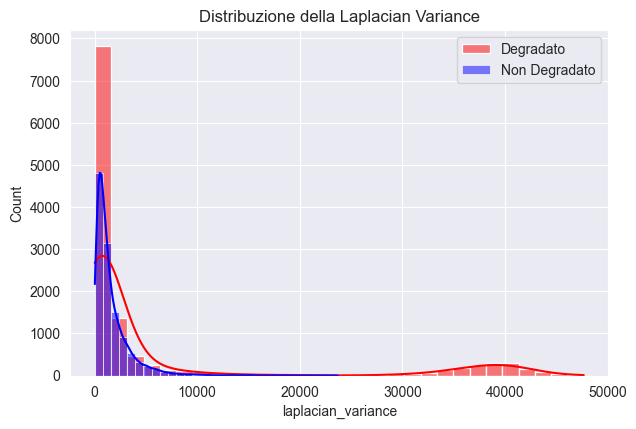

In [14]:
metric = "laplacian_variance"

plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)

sns.histplot(df_degradato[metric], kde=True, label='Degradato', color='red', bins=30)

sns.histplot(df_non_degradato[metric], kde=True, label='Non Degradato', color='blue', bins=30)

plt.title(f'Distribuzione della {metric.replace("_", " ").title()}')
plt.legend()

plt.tight_layout()
plt.show()


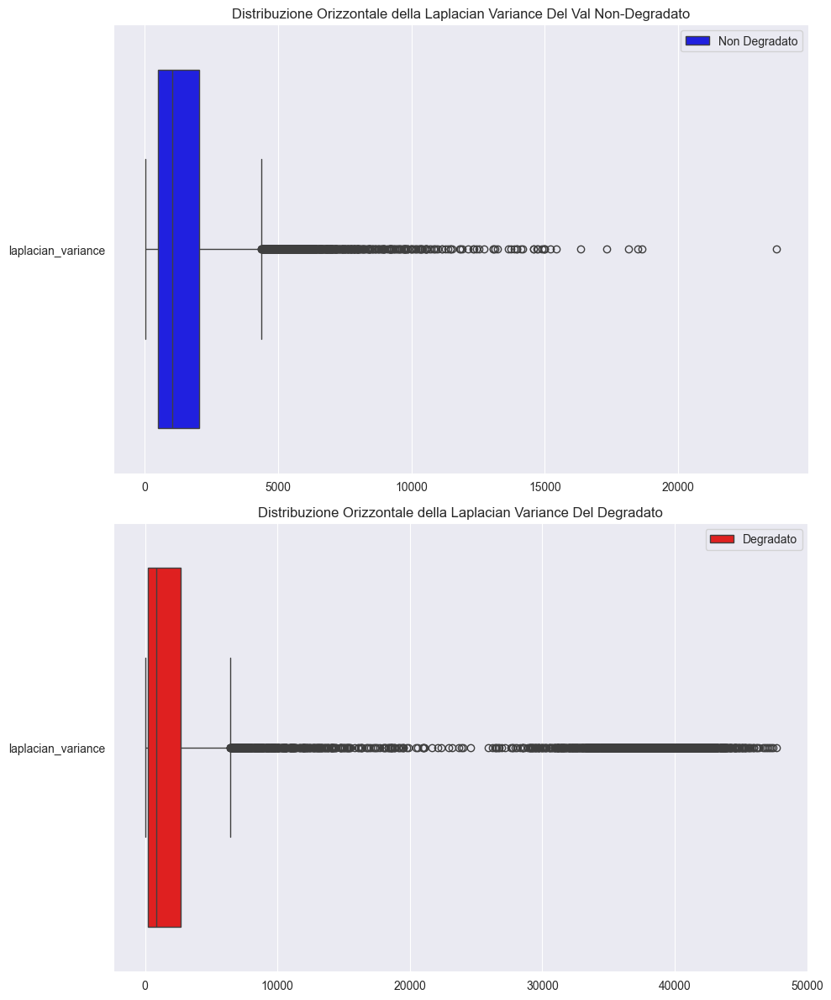

In [17]:
plt.figure(figsize=(10, 12))

plt.subplot(2, 1, 1)
sns.boxplot(data=df_non_degradato[['laplacian_variance']], orient='h', color='blue', label='Non Degradato')
plt.title('Distribuzione Orizzontale della Laplacian Variance Del Val Non-Degradato')
plt.legend()

plt.subplot(2, 1, 2)
sns.boxplot(data=df_degradato[['laplacian_variance']], orient='h', color='red', label='Degradato')
plt.title('Distribuzione Orizzontale della Laplacian Variance Del Degradato')
plt.legend()

plt.tight_layout()
plt.show()

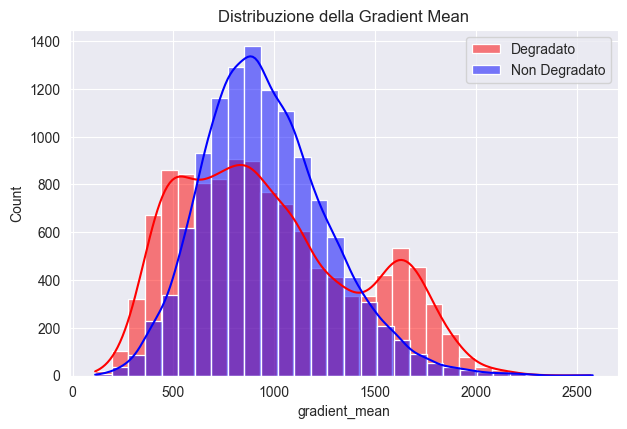

In [18]:
metric = "gradient_mean"

plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)

sns.histplot(df_degradato[metric], kde=True, label='Degradato', color='red', bins=30)

sns.histplot(df_non_degradato[metric], kde=True, label='Non Degradato', color='blue', bins=30)

plt.title(f'Distribuzione della {metric.replace("_", " ").title()}')
plt.legend()

plt.tight_layout()
plt.show()


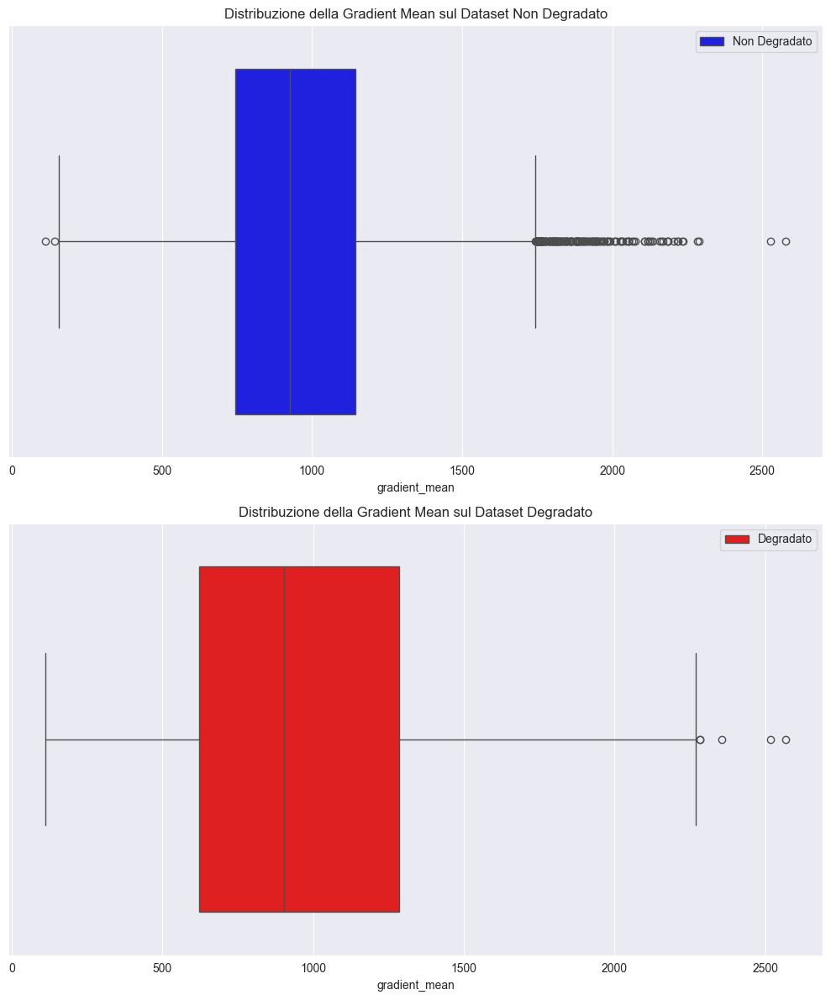

In [19]:
plt.figure(figsize=(10, 12))

plt.subplot(2, 1, 1)
sns.boxplot(data=df_non_degradato[metric], orient='h', color='blue', label='Non Degradato')
plt.title(f'Distribuzione della {metric.replace("_", " ").title()} sul Dataset Non Degradato')
plt.legend()


plt.subplot(2, 1, 2)
sns.boxplot(data=df_degradato[metric], orient='h', color='red', label='Degradato')
plt.title(f'Distribuzione della {metric.replace("_", " ").title()} sul Dataset Degradato')
plt.legend()

plt.tight_layout()
plt.show()

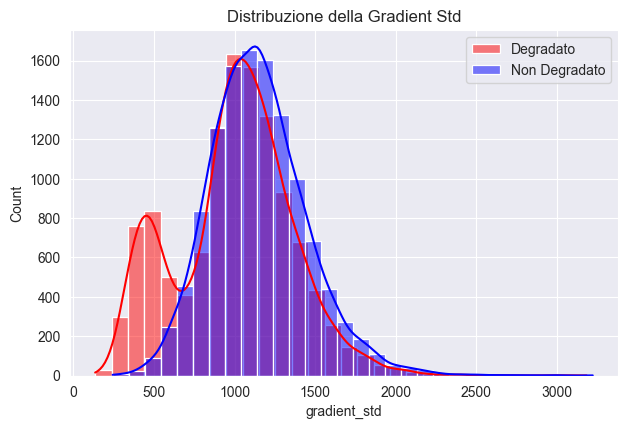

In [21]:
metric = "gradient_std"

plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)

sns.histplot(df_degradato[metric], kde=True, label='Degradato', color='red', bins=30)

sns.histplot(df_non_degradato[metric], kde=True, label='Non Degradato', color='blue', bins=30)

plt.title(f'Distribuzione della {metric.replace("_", " ").title()}')
plt.legend()

plt.tight_layout()
plt.show()

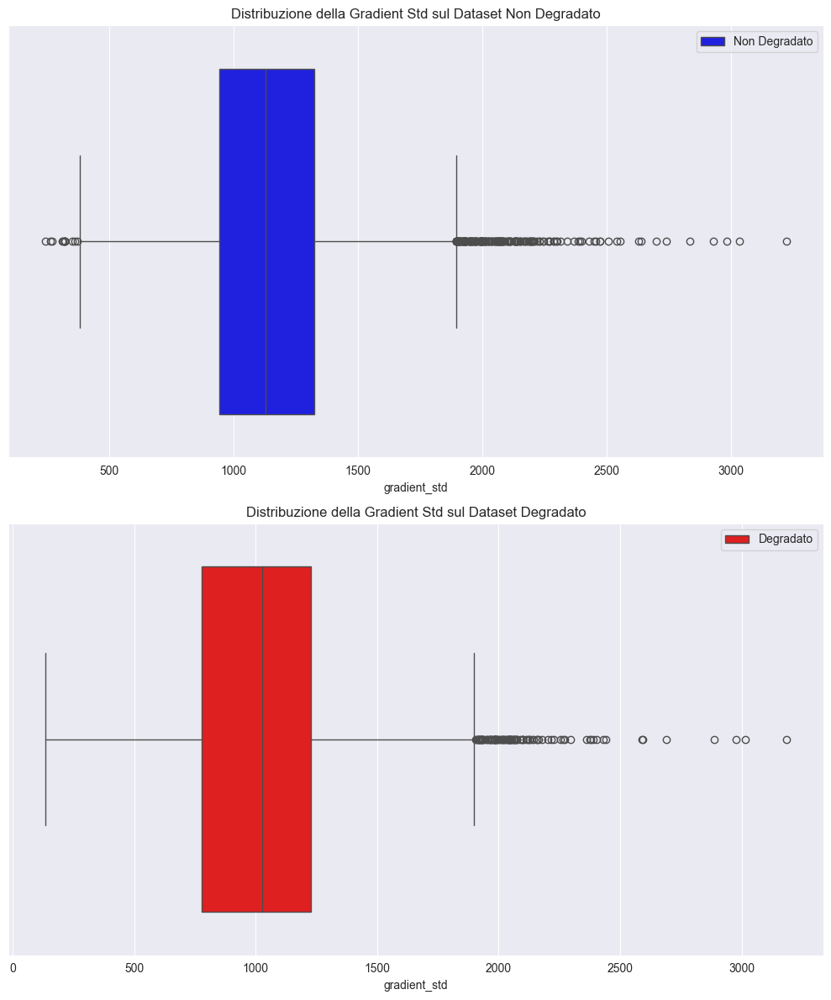

In [22]:
plt.figure(figsize=(10, 12))

plt.subplot(2, 1, 1)
sns.boxplot(data=df_non_degradato[metric], orient='h', color='blue', label='Non Degradato')
plt.title(f'Distribuzione della {metric.replace("_", " ").title()} sul Dataset Non Degradato')
plt.legend()

plt.subplot(2, 1, 2)
sns.boxplot(data=df_degradato[metric], orient='h', color='red', label='Degradato')
plt.title(f'Distribuzione della {metric.replace("_", " ").title()} sul Dataset Degradato')
plt.legend()

plt.tight_layout()
plt.show()

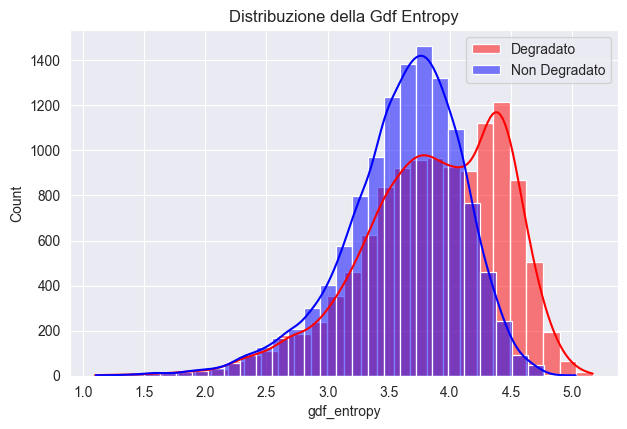

In [23]:
metric = "gdf_entropy"

plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)

sns.histplot(df_degradato[metric], kde=True, label='Degradato', color='red', bins=30)

sns.histplot(df_non_degradato[metric], kde=True, label='Non Degradato', color='blue', bins=30)

plt.title(f'Distribuzione della {metric.replace("_", " ").title()}')
plt.legend()

plt.tight_layout()
plt.show()

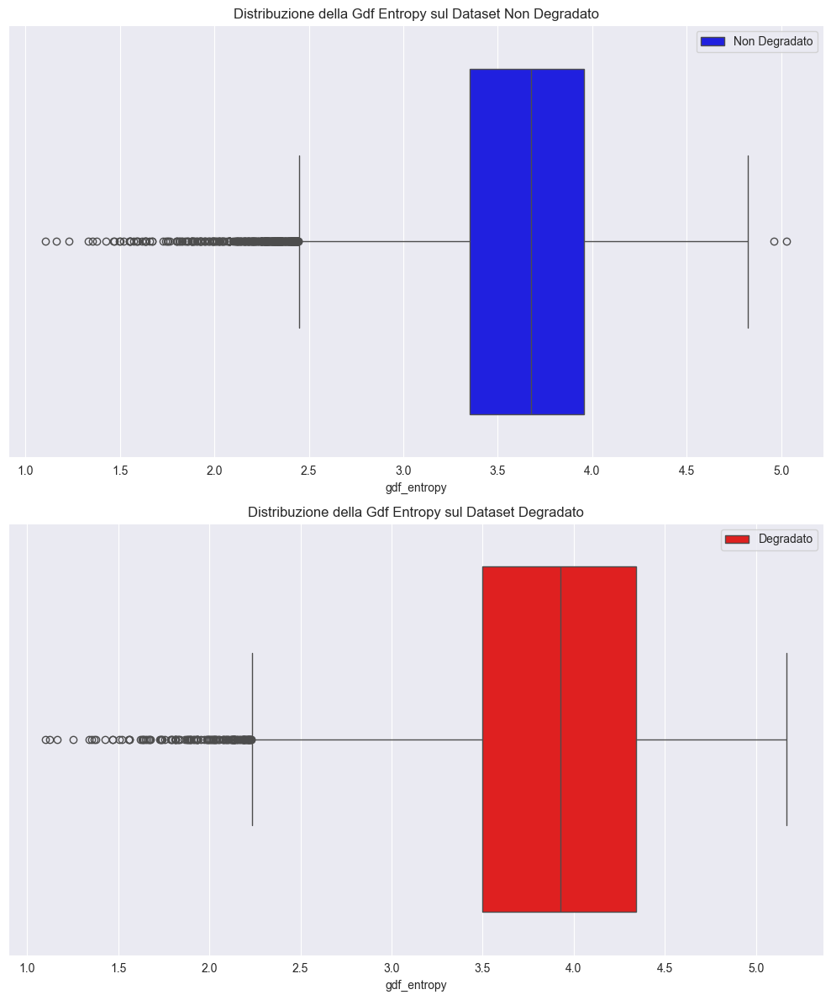

In [25]:
plt.figure(figsize=(10, 12))

plt.subplot(2, 1, 1)
sns.boxplot(data=df_non_degradato[metric], orient='h', color='blue', label='Non Degradato')
plt.title(f'Distribuzione della {metric.replace("_", " ").title()} sul Dataset Non Degradato')
plt.legend()

plt.subplot(2, 1, 2)
sns.boxplot(data=df_degradato[metric], orient='h', color='red', label='Degradato')
plt.title(f'Distribuzione della {metric.replace("_", " ").title()} sul Dataset Degradato')
plt.legend()

plt.tight_layout()
plt.show()

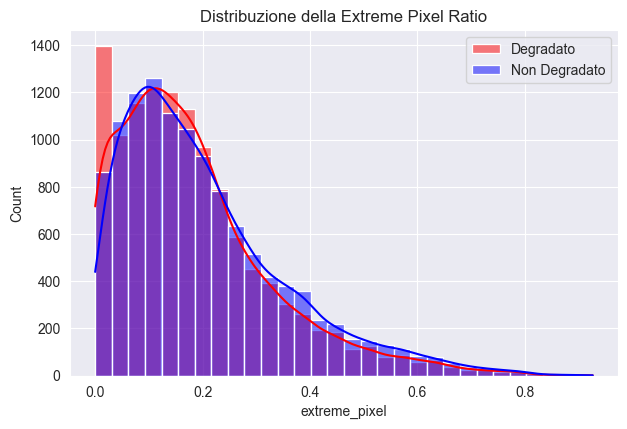

In [5]:
metric = "extreme_pixel"

plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)

sns.histplot(df_degradato[metric], kde=True, label='Degradato', color='red', bins=30)

sns.histplot(df_non_degradato[metric], kde=True, label='Non Degradato', color='blue', bins=30)

plt.title(f'Distribuzione della {metric.replace("_", " ").title()} Ratio')
plt.legend()

plt.tight_layout()
plt.show()

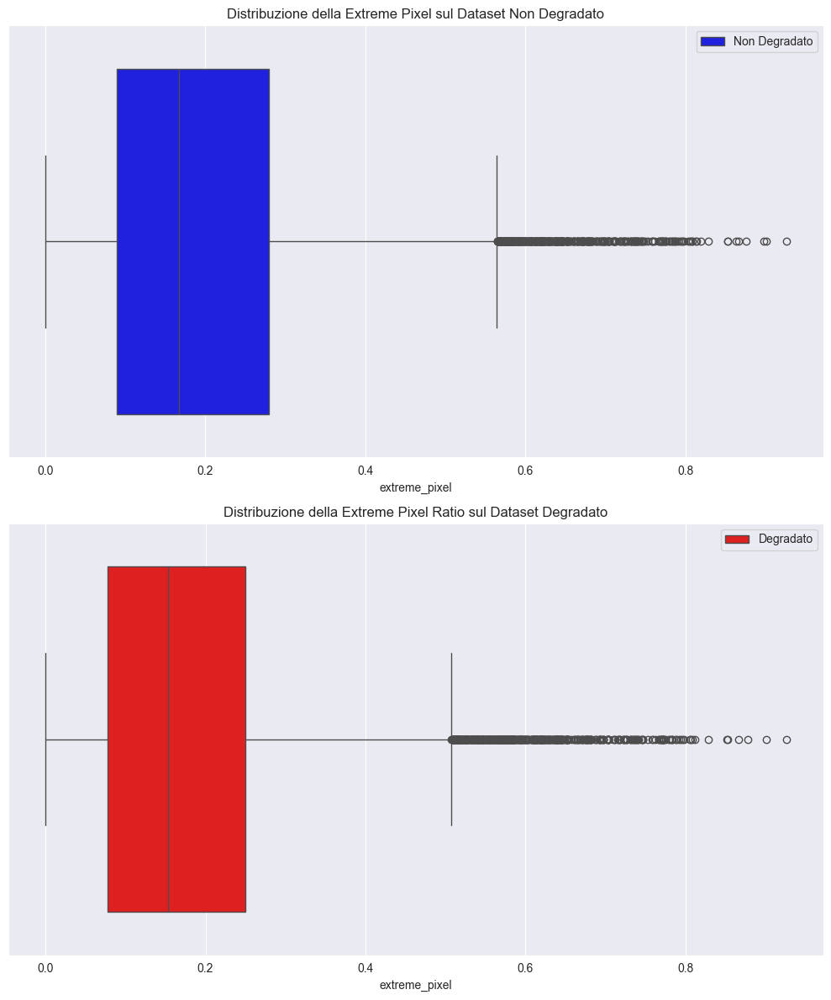

In [6]:
plt.figure(figsize=(10, 12))

plt.subplot(2, 1, 1)
sns.boxplot(data=df_non_degradato[metric], orient='h', color='blue', label='Non Degradato')
plt.title(f'Distribuzione della {metric.replace("_", " ").title()} sul Dataset Non Degradato')
plt.legend()

plt.subplot(2, 1, 2)
sns.boxplot(data=df_degradato[metric], orient='h', color='red', label='Degradato')
plt.title(f'Distribuzione della {metric.replace("_", " ").title()} Ratio sul Dataset Degradato')
plt.legend()

plt.tight_layout()
plt.show()

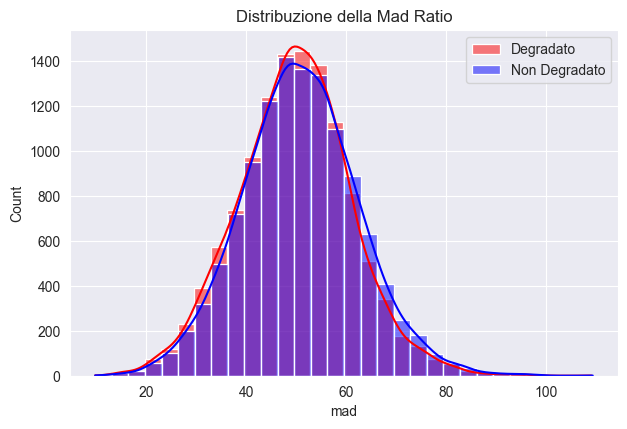

In [10]:
metric = "mad"

plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)

sns.histplot(df_degradato[metric], kde=True, label='Degradato', color='red', bins=30)

sns.histplot(df_non_degradato[metric], kde=True, label='Non Degradato', color='blue', bins=30)

plt.title(f'Distribuzione della {metric.replace("_", " ").title()} Ratio')
plt.legend()

plt.tight_layout()
plt.show()

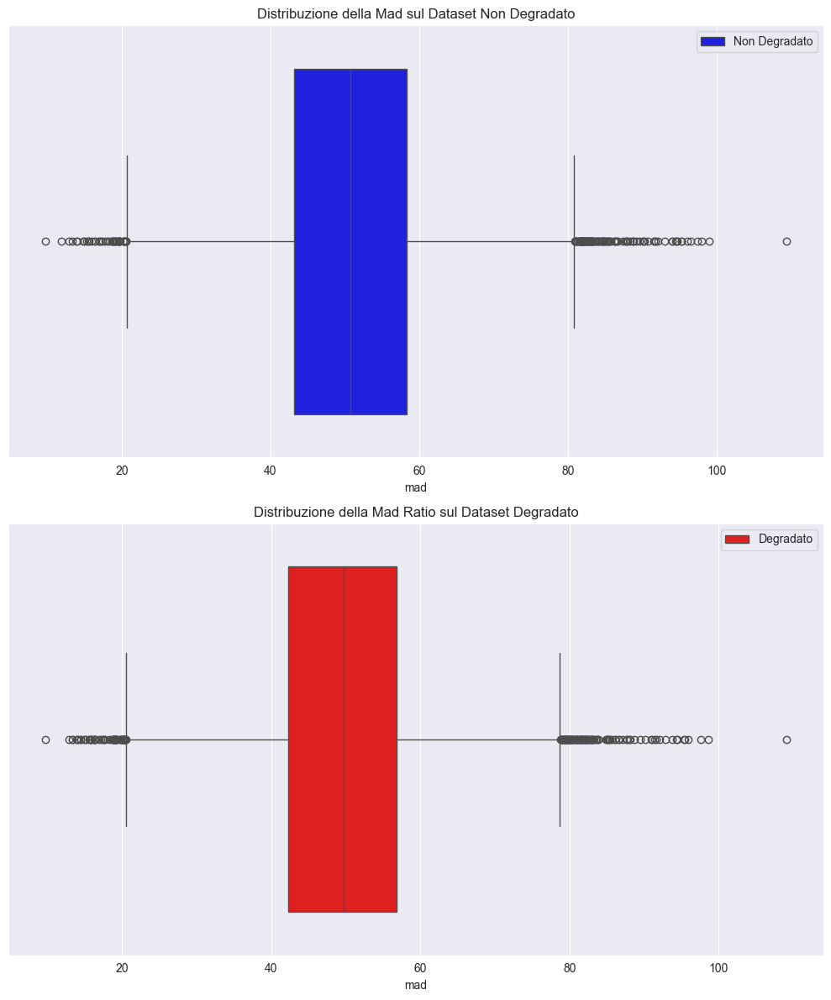

In [11]:
plt.figure(figsize=(10, 12))

plt.subplot(2, 1, 1)
sns.boxplot(data=df_non_degradato[metric], orient='h', color='blue', label='Non Degradato')
plt.title(f'Distribuzione della {metric.replace("_", " ").title()} sul Dataset Non Degradato')
plt.legend()

plt.subplot(2, 1, 2)
sns.boxplot(data=df_degradato[metric], orient='h', color='red', label='Degradato')
plt.title(f'Distribuzione della {metric.replace("_", " ").title()} Ratio sul Dataset Degradato')
plt.legend()

plt.tight_layout()
plt.show()

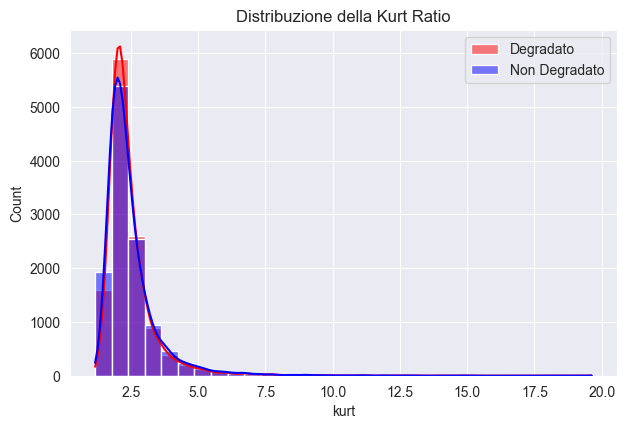

In [12]:
metric = "kurt"

plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)

sns.histplot(df_degradato[metric], kde=True, label='Degradato', color='red', bins=30)

sns.histplot(df_non_degradato[metric], kde=True, label='Non Degradato', color='blue', bins=30)

plt.title(f'Distribuzione della {metric.replace("_", " ").title()} Ratio')
plt.legend()

plt.tight_layout()
plt.show()

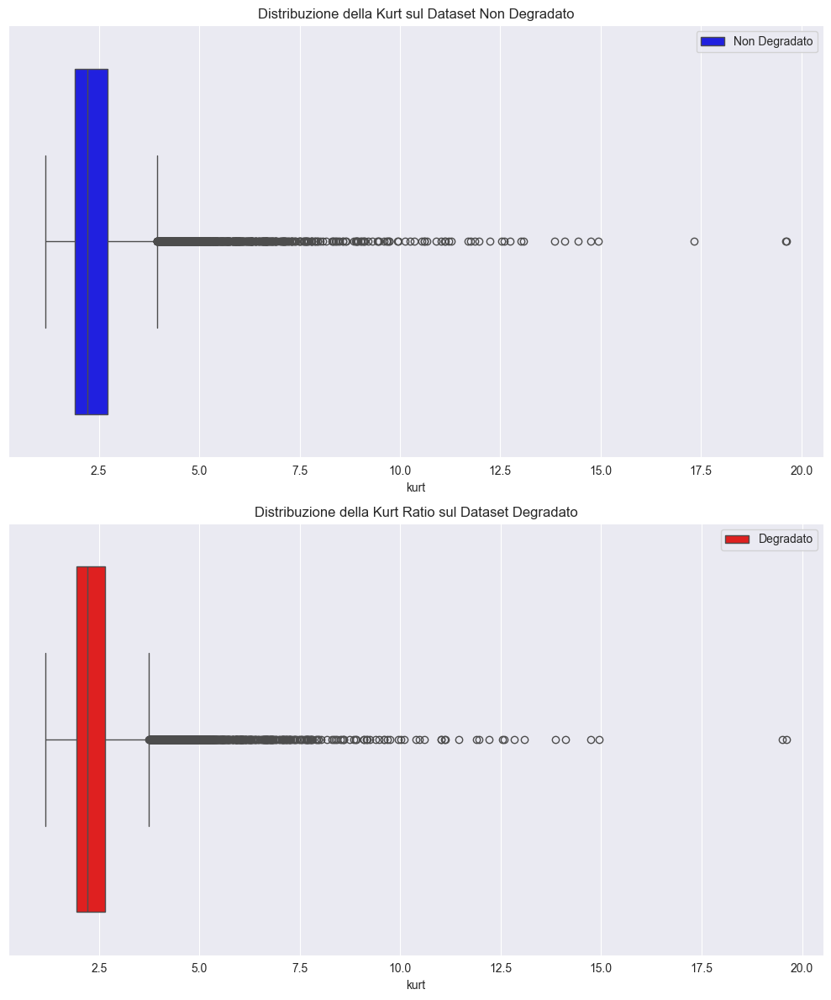

In [13]:
plt.figure(figsize=(10, 12))

plt.subplot(2, 1, 1)
sns.boxplot(data=df_non_degradato[metric], orient='h', color='blue', label='Non Degradato')
plt.title(f'Distribuzione della {metric.replace("_", " ").title()} sul Dataset Non Degradato')
plt.legend()

plt.subplot(2, 1, 2)
sns.boxplot(data=df_degradato[metric], orient='h', color='red', label='Degradato')
plt.title(f'Distribuzione della {metric.replace("_", " ").title()} Ratio sul Dataset Degradato')
plt.legend()

plt.tight_layout()
plt.show()

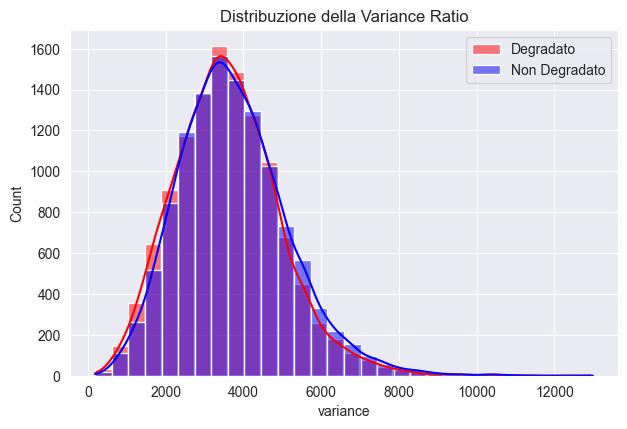

In [3]:
metric = "variance"

plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)

sns.histplot(df_degradato[metric], kde=True, label='Degradato', color='red', bins=30)

sns.histplot(df_non_degradato[metric], kde=True, label='Non Degradato', color='blue', bins=30)

plt.title(f'Distribuzione della {metric.replace("_", " ").title()} Ratio')
plt.legend()

plt.tight_layout()
plt.show()

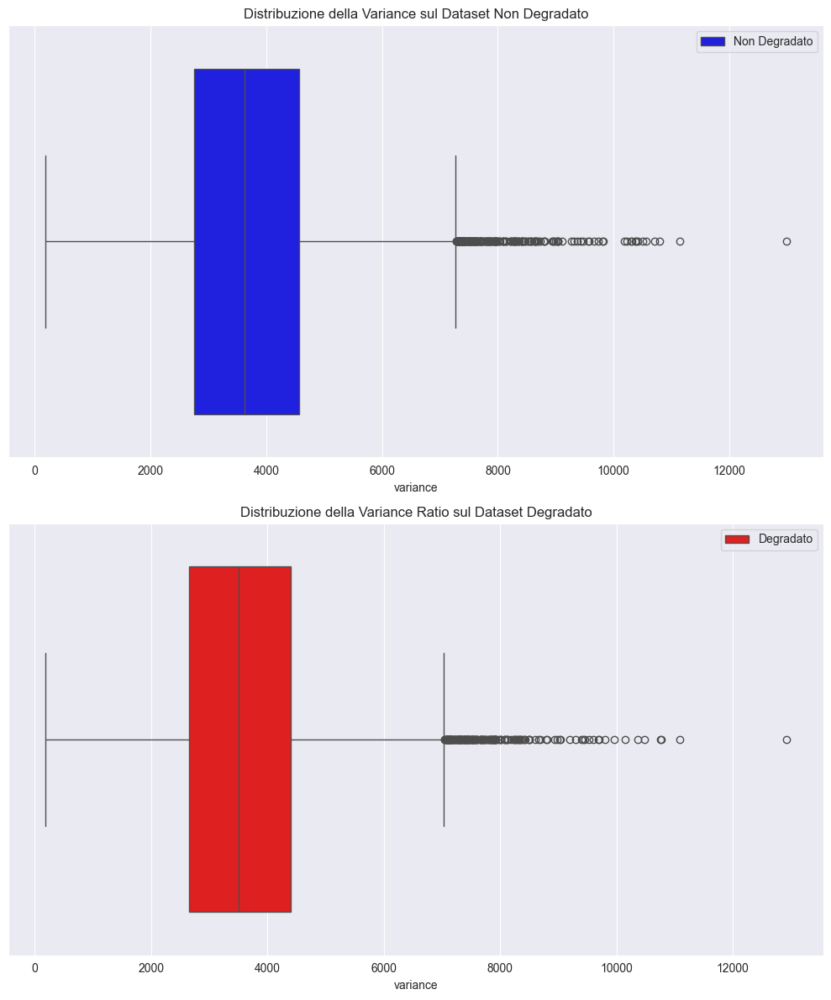

In [4]:
plt.figure(figsize=(10, 12))

plt.subplot(2, 1, 1)
sns.boxplot(data=df_non_degradato[metric], orient='h', color='blue', label='Non Degradato')
plt.title(f'Distribuzione della {metric.replace("_", " ").title()} sul Dataset Non Degradato')
plt.legend()

plt.subplot(2, 1, 2)
sns.boxplot(data=df_degradato[metric], orient='h', color='red', label='Degradato')
plt.title(f'Distribuzione della {metric.replace("_", " ").title()} Ratio sul Dataset Degradato')
plt.legend()

plt.tight_layout()
plt.show()

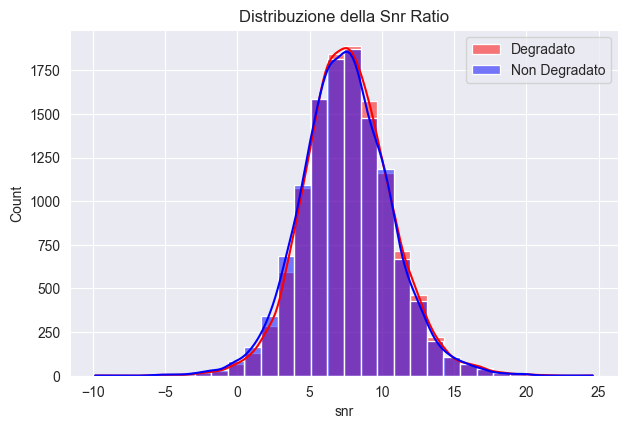

In [9]:
metric = "snr"

plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)

sns.histplot(df_degradato[metric], kde=True, label='Degradato', color='red', bins=30)

sns.histplot(df_non_degradato[metric], kde=True, label='Non Degradato', color='blue', bins=30)

plt.title(f'Distribuzione della {metric.replace("_", " ").title()} Ratio')
plt.legend()

plt.tight_layout()
plt.show()

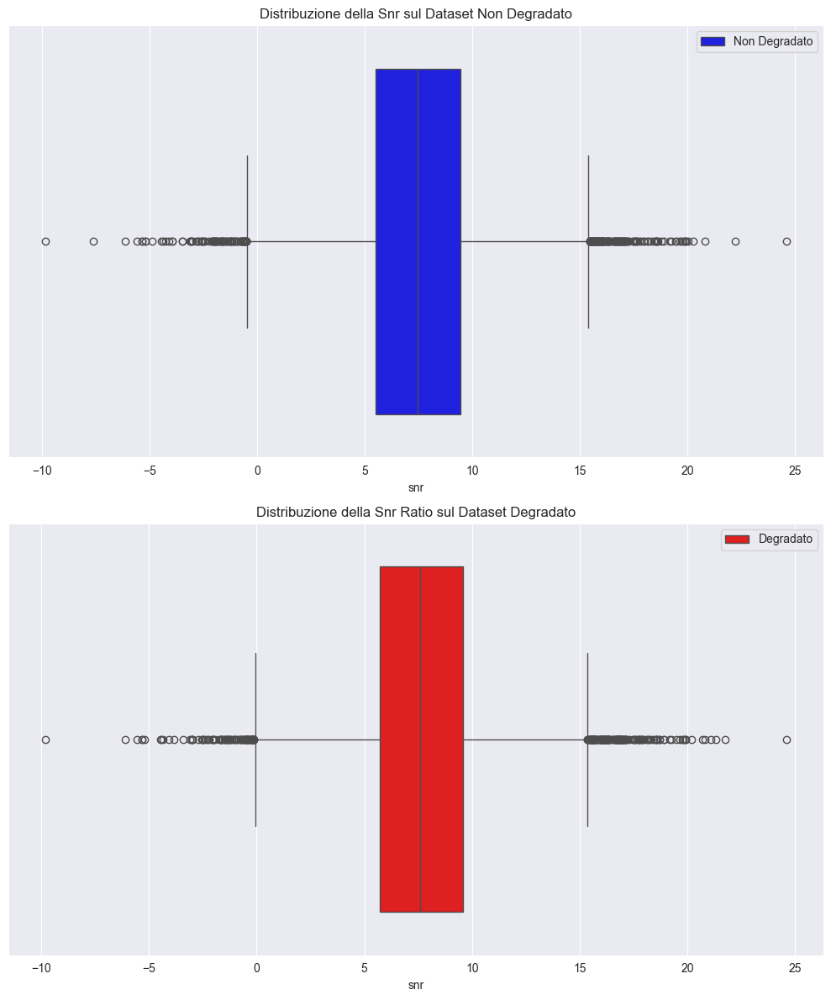

In [10]:
plt.figure(figsize=(10, 12))

plt.subplot(2, 1, 1)
sns.boxplot(data=df_non_degradato[metric], orient='h', color='blue', label='Non Degradato')
plt.title(f'Distribuzione della {metric.replace("_", " ").title()} sul Dataset Non Degradato')
plt.legend()

plt.subplot(2, 1, 2)
sns.boxplot(data=df_degradato[metric], orient='h', color='red', label='Degradato')
plt.title(f'Distribuzione della {metric.replace("_", " ").title()} Ratio sul Dataset Degradato')
plt.legend()

plt.tight_layout()
plt.show()

In [29]:
metric = "laplacian_variance"
print(f"Metric {metric} Non-Degradato: {df_non_degradato[metric].describe()}")
print(f"Metric {metric} Degradato: {df_degradato[metric].describe()}")

Metric laplacian_variance Non-Degradato: count    11915.000000
mean      1604.456165
std       1757.076429
min         14.830055
25%        507.328068
50%       1025.225263
75%       2056.004632
max      23685.665470
Name: laplacian_variance, dtype: float64
Metric laplacian_variance Degradato: count    11915.000000
mean      6242.363238
std      12664.300131
min          1.905802
25%        244.618339
50%        830.629330
75%       2720.647121
max      47680.676833
Name: laplacian_variance, dtype: float64


In [5]:
metric = "variance"
print(f"Metric {metric} Non-Degradato: {df_non_degradato[metric].describe()}")
print(f"Metric {metric} Degradato: {df_degradato[metric].describe()}")

Metric variance Non-Degradato: count    11915.000000
mean      3740.547287
std       1401.669002
min        186.777066
25%       2756.083245
50%       3621.386633
75%       4564.007801
max      12984.646714
Name: variance, dtype: float64
Metric variance Degradato: count    11915.000000
mean      3583.738385
std       1354.012972
min        186.786448
25%       2648.506367
50%       3510.769986
75%       4406.738612
max      12921.134610
Name: variance, dtype: float64


In [11]:
metric = "snr"
print(f"Metric {metric} Non-Degradato: {df_non_degradato[metric].describe()}")
print(f"Metric {metric} Degradato: {df_degradato[metric].describe()}")

Metric snr Non-Degradato: count    11915.000000
mean         7.493952
std          3.113851
min         -9.827864
25%          5.495936
50%          7.442361
75%          9.466690
max         24.593448
Name: snr, dtype: float64
Metric snr Degradato: count    11915.000000
mean         7.675570
std          3.062462
min         -9.807826
25%          5.699466
50%          7.569871
75%          9.558112
max         24.593251
Name: snr, dtype: float64


In [30]:
metric = "gradient_mean"
print(f"Metric {metric} Non-Degradato: {df_non_degradato[metric].describe()}")
print(f"Metric {metric} Degradato: {df_degradato[metric].describe()}")

Metric gradient_mean Non-Degradato: count    11915.000000
mean       958.217737
std        307.670190
min        111.855348
25%        744.001297
50%        926.911789
75%       1143.876867
max       2578.027876
Name: gradient_mean, dtype: float64
Metric gradient_mean Degradato: count    11915.000000
mean       975.986765
std        438.906960
min        111.861681
25%        621.814032
50%        903.418240
75%       1285.109207
max       2567.777338
Name: gradient_mean, dtype: float64


In [31]:
metric = "gradient_std"
print(f"Metric {metric} Non-Degradato: {df_non_degradato[metric].describe()}")
print(f"Metric {metric} Degradato: {df_degradato[metric].describe()}")

Metric gradient_std Non-Degradato: count    11915.000000
mean      1148.124927
std        300.884817
min        243.859227
25%        942.895033
50%       1127.771370
75%       1323.388797
max       3222.272371
Name: gradient_std, dtype: float64
Metric gradient_std Degradato: count    11915.000000
mean       997.967096
std        364.732745
min        135.325385
25%        778.831241
50%       1026.518850
75%       1228.125668
max       3184.143354
Name: gradient_std, dtype: float64


In [32]:
metric = "gdf_entropy"
print(f"Metric {metric} Non-Degradato: {df_non_degradato[metric].describe()}")
print(f"Metric {metric} Degradato: {df_degradato[metric].describe()}")

Metric gdf_entropy Non-Degradato: count    11915.000000
mean         3.618359
std          0.486493
min          1.105966
25%          3.352698
50%          3.674605
75%          3.955406
max          5.027449
Name: gdf_entropy, dtype: float64
Metric gdf_entropy Degradato: count    11915.000000
mean         3.867072
std          0.590375
min          1.100200
25%          3.497442
50%          3.926674
75%          4.340468
max          5.167079
Name: gdf_entropy, dtype: float64


In [7]:
metric = "extreme_pixel"
print(f"Metric {metric} Non-Degradato: {df_non_degradato[metric].describe()} Rate")
print(f"Metric {metric} Degradato: {df_degradato[metric].describe()} Rate")

Metric extreme_pixel Non-Degradato: count    11915.000000
mean         0.203527
std          0.153986
min          0.000000
25%          0.088994
50%          0.166733
75%          0.279201
max          0.926285
Name: extreme_pixel, dtype: float64 Rate
Metric extreme_pixel Degradato: count    11915.000000
mean         0.183270
std          0.145766
min          0.000000
25%          0.077641
50%          0.153407
75%          0.249455
max          0.926159
Name: extreme_pixel, dtype: float64 Rate


In [14]:
metric = "mad"
print(f"Metric {metric} Non-Degradato: {df_non_degradato[metric].describe()} Rate")
print(f"Metric {metric} Degradato: {df_degradato[metric].describe()} Rate")

Metric mad Non-Degradato: count    11915.000000
mean        50.839941
std         11.622830
min          9.732316
25%         43.209321
50%         50.716793
75%         58.267363
max        109.359744
Name: mad, dtype: float64 Rate
Metric mad Degradato: count    11915.000000
mean        49.650328
std         11.322284
min          9.732231
25%         42.317757
50%         49.726675
75%         56.861260
max        109.081835
Name: mad, dtype: float64 Rate


In [15]:
metric = "kurt"
print(f"Metric {metric} Non-Degradato: {df_non_degradato[metric].describe()} Rate")
print(f"Metric {metric} Degradato: {df_degradato[metric].describe()} Rate")

Metric kurt Non-Degradato: count    11915.000000
mean         2.500267
std          1.097265
min          1.169025
25%          1.902541
50%          2.219867
75%          2.720699
max         19.628681
Name: kurt, dtype: float64 Rate
Metric kurt Degradato: count    11915.000000
mean         2.464267
std          0.996459
min          1.169990
25%          1.934482
50%          2.214119
75%          2.658965
max         19.610663
Name: kurt, dtype: float64 Rate


## Verifica delle metriche

In alcune metriche, i risultati ottenuti non sono stati particolarmente significativi. Tuttavia, per altre metriche, come la varianza del Laplaciano, la varianza del gradiente, la media del gradiente, la deviazione standard del gradiente e l'entropia della Funzione di Distribuzione del Gradiente, le distribuzioni di questi valori per le immagini prive di rumore e con rumore hanno fornito indicazioni rilevanti.

Proviamo a fare qualche ipotesi e dimostrazioni delle ipotesi.

1. Immagini con una varianza laplacina molto bassa, inferiore a 150, sono immagini sfocate.

In [39]:
test_path = '../ground_truth/my_val_info.csv'
test_image_path = '/Users/annamarika/Desktop/val_set_degraded'
from scripts.ImageDataset import ImageDataset

In [41]:
test_table = pd.read_csv(test_path, header=None, names=['image_id', 'label'])

test_dataset = ImageDataset(test_table, test_image_path, train=False)

In [46]:
images_to_display = []

for i in range(len(test_dataset)):
    image = test_dataset.get_image_by_index(i)
    blurry_metrics = detect_noises(image)
    if blurry_metrics["laplacian_variance"] < 50:
        images_to_display.append(image)
    if len(images_to_display) >= 10:
        break


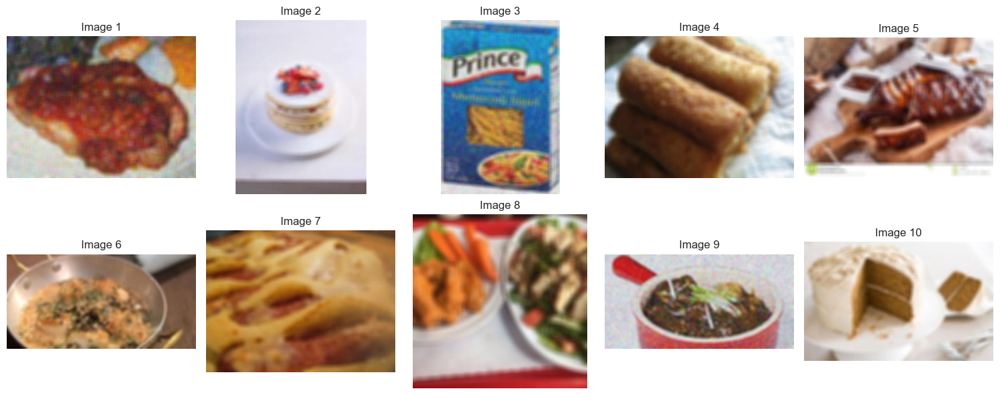

In [47]:
fig, axes = plt.subplots(2, 5, figsize=(15, 6))

axes = axes.flatten()

for i, ax in enumerate(axes):
    if i < len(images_to_display):
        ax.imshow(images_to_display[i])
        ax.axis('off')
        ax.set_title(f"Image {i+1}")
    else:
        ax.axis('off')

plt.tight_layout()
plt.show()

2. Immagini con un varianza laplaciana superiore al 5000 hanno invece brusche variazioni e sono quindi rumorose

In [51]:
images_to_display = []

for i in range(len(test_dataset)):
    image = test_dataset.get_image_by_index(i)
    blurry_metrics = detect_noises(image)
    if blurry_metrics["laplacian_variance"] > 5000:
        images_to_display.append(image)
    if len(images_to_display) >= 10:
        break

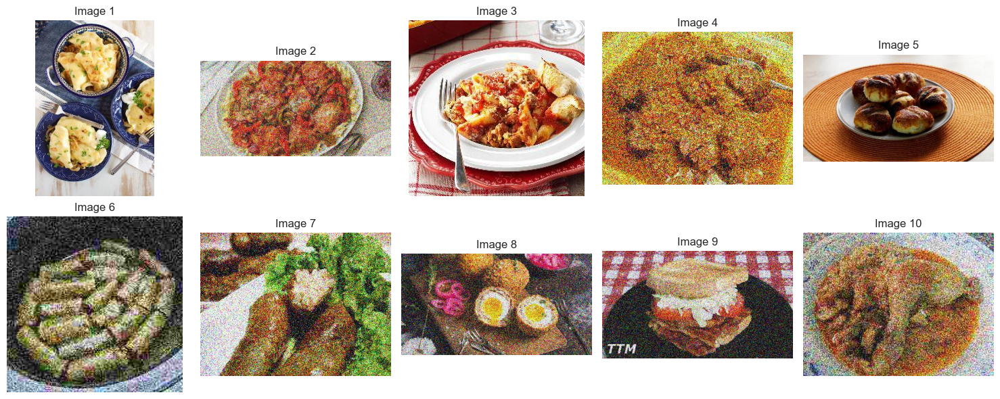

In [52]:
fig, axes = plt.subplots(2, 5, figsize=(15, 6))

axes = axes.flatten()

for i, ax in enumerate(axes):
    if i < len(images_to_display):
        ax.imshow(images_to_display[i])
        ax.axis('off')
        ax.set_title(f"Image {i+1}")
    else:
        ax.axis('off')

plt.tight_layout()
plt.show()

Sette immagini su dieci presentano rumore


3. Immagini con un media del gradiente maggiore di 1250 sono rumorose

In [55]:
images_to_display = []

for i in range(len(test_dataset)):
    image = test_dataset.get_image_by_index(i)
    blurry_metrics = detect_noises(image)
    if blurry_metrics["gradient_mean"] > 1250:
        images_to_display.append(image)
    if len(images_to_display) >= 10:
        break

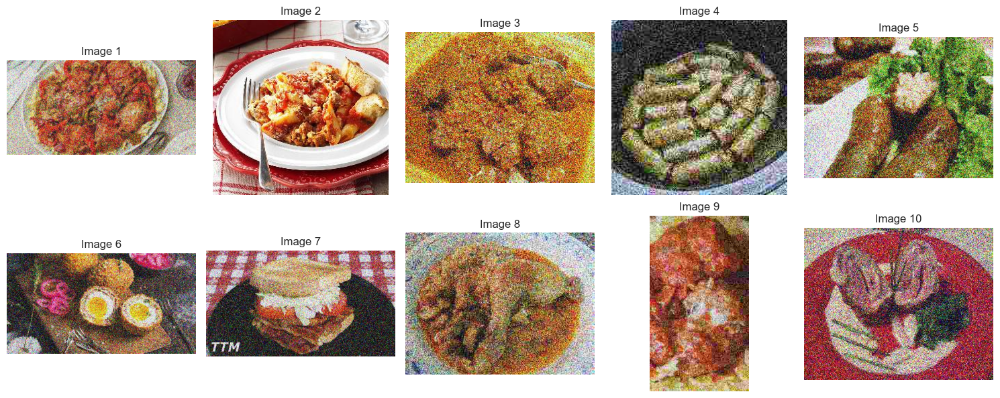

In [56]:
fig, axes = plt.subplots(2, 5, figsize=(15, 6))

axes = axes.flatten()

for i, ax in enumerate(axes):
    if i < len(images_to_display):
        ax.imshow(images_to_display[i])
        ax.axis('off')
        ax.set_title(f"Image {i+1}")
    else:
        ax.axis('off')

plt.tight_layout()
plt.show()

Nove immagini su dieci presentano rumore

4. un'entropia della GDF superiore a 4.5 indica che l'immagine presenta una distribuzione dei gradienti "rumorosa"

In [60]:
images_to_display = []

for i in range(len(test_dataset)):
    image = test_dataset.get_image_by_index(i)
    blurry_metrics = detect_noises(image)
    if blurry_metrics["gdf_entropy"] > 4.5:
        images_to_display.append(image)
    if len(images_to_display) >= 10:
        break

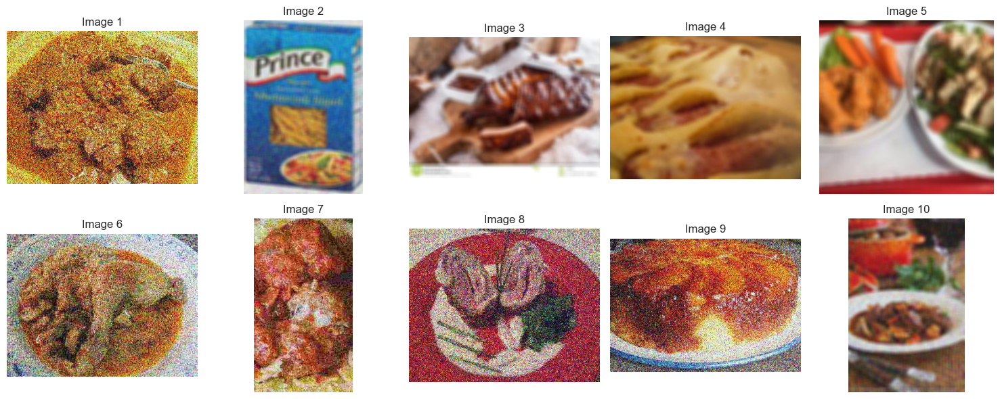

In [61]:
fig, axes = plt.subplots(2, 5, figsize=(15, 6))

axes = axes.flatten()

for i, ax in enumerate(axes):
    if i < len(images_to_display):
        ax.imshow(images_to_display[i])
        ax.axis('off')
        ax.set_title(f"Image {i+1}")
    else:
        ax.axis('off')

plt.tight_layout()
plt.show()

5. Una variande del gradiente inferiore a 450 implica che l'immagine sia sfocata

In [63]:
images_to_display = []

for i in range(len(test_dataset)):
    image = test_dataset.get_image_by_index(i)
    blurry_metrics = detect_noises(image)
    if blurry_metrics["gradient_std"] < 450:
        images_to_display.append(image)
    if len(images_to_display) >= 10:
        break

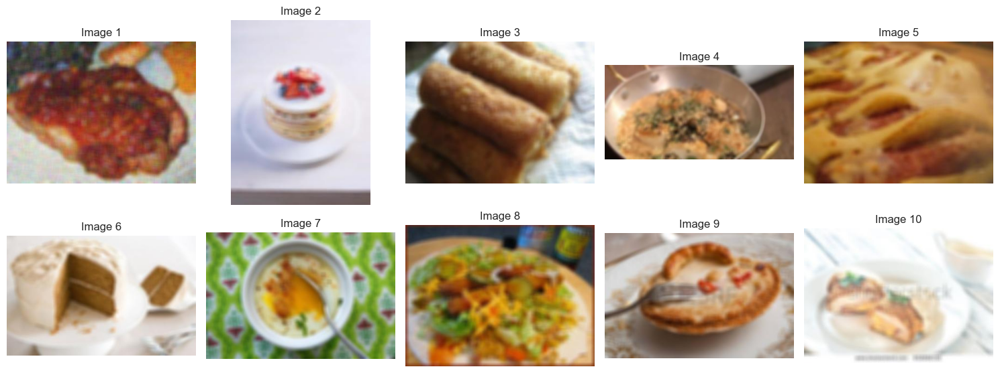

In [64]:
fig, axes = plt.subplots(2, 5, figsize=(15, 6))

axes = axes.flatten()

for i, ax in enumerate(axes):
    if i < len(images_to_display):
        ax.imshow(images_to_display[i])
        ax.axis('off')
        ax.set_title(f"Image {i+1}")
    else:
        ax.axis('off')

plt.tight_layout()
plt.show()

## La costruzione di una soluzione

In base ai risultati delle analisi del dataset, ai rumori individuati e all'utilizzo delle metriche selezionate, è possibile costruire una pipeline di pre-elaborazione delle immagini per la rimozione del rumore.

Di seguito sono quindi progettati metodi che implementino correzioni specifiche ai tipi di rumore e applicare tali correzioni nei casi identificati.

In [72]:
def adaptive_gamma_correction(image: Image.Image, sigma_color: float = 0.1, sigma_space: float = 15, saturation_factor: float = 1.5) -> Image.Image:
    image_np = np.array(image)

    ycbcr_image = cv2.cvtColor(image_np, cv2.COLOR_RGB2YCrCb)

    y_channel = ycbcr_image[:, :, 0] / 255.0

    inverted_mask = 1.0 - y_channel
    bilateral_mask = cv2.bilateralFilter(inverted_mask.astype(np.float32), d=0, sigmaColor=sigma_color, sigmaSpace=sigma_space)

    gray_image = cv2.cvtColor(image_np, cv2.COLOR_RGB2GRAY)
    mean_intensity = np.mean(gray_image)

    if mean_intensity < 128:
        alpha = np.log(mean_intensity / 255.0) / np.log(0.5)
    else:
        alpha = np.log(0.5) / np.log(mean_intensity / 255.0)

    adaptive_gamma = alpha ** ((0.5 - bilateral_mask) / 0.5)
    corrected_y_channel = np.power(y_channel, adaptive_gamma)

    ycbcr_image[:, :, 0] = np.clip(corrected_y_channel * 255.0, 0, 255).astype(np.uint8)

    corrected_image = cv2.cvtColor(ycbcr_image, cv2.COLOR_YCrCb2RGB)

    hsv_image = cv2.cvtColor(corrected_image, cv2.COLOR_RGB2HSV)
    hsv_image[:, :, 1] = np.clip(hsv_image[:, :, 1] * saturation_factor, 0, 255).astype(np.uint8)

    final_image = cv2.cvtColor(hsv_image, cv2.COLOR_HSV2RGB)
    result_image = Image.fromarray(final_image)

    return result_image

In [73]:
def max_rgb(image: Image.Image, saturation = False, sfactor=1):
    image_cv = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2BGR)

    max_R = np.max(image_cv[:, :, 2]) or 1
    max_G = np.max(image_cv[:, :, 1]) or 1
    max_B = np.max(image_cv[:, :, 0]) or 1

    coeff = [255.0 / max_R, 255.0 / max_G, 255.0 / max_B]
    image_cv[:, :, 2] = (image_cv[:, :, 2] * coeff[0]).clip(0, 255)
    image_cv[:, :, 1] = (image_cv[:, :, 1] * coeff[1]).clip(0, 255)
    image_cv[:, :, 0] = (image_cv[:, :, 0] * coeff[2]).clip(0, 255)

    # Convert to HSV and enhance saturation, if saturation enable
    image_hsv = cv2.cvtColor(image_cv, cv2.COLOR_BGR2HSV).astype(np.float32)
    if saturation:
        image_hsv[:, :, 1] = (image_hsv[:, :, 1] * sfactor).clip(0, 255)
    image_cv = cv2.cvtColor(image_hsv.astype(np.uint8), cv2.COLOR_HSV2BGR)

    # Convert back to PIL image
    enhanced_image_pil = Image.fromarray(cv2.cvtColor(image_cv, cv2.COLOR_BGR2RGB))

    return enhanced_image_pil

In [67]:
def deblurring(image):
    image = np.array(image)

    sharpen_kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
    sharpen = cv2.filter2D(image, 0 , sharpen_kernel)
    deblurred = cv2.fastNlMeansDenoisingColored(sharpen,None,10,10,7,21)
    denoised_image = Image.fromarray(deblurred)
    return denoised_image

In [68]:
def denoise_bilateral(image):
    image = np.array(image)
    denoised_bilateral = cv2.bilateralFilter(image, 9, 75, 75)
    bilateral_rgb = cv2.cvtColor(denoised_bilateral, cv2.COLOR_BGR2RGB)
    denoised_image = Image.fromarray(bilateral_rgb)
    return denoised_image

In [69]:
def denoise_salt_pepper(image: Image.Image, kernel_size: int = 3) -> Image.Image:
    if kernel_size % 2 == 0:
        raise ValueError("Kernel size must be an odd integer.")

    image_np = np.array(image)

    if len(image_np.shape) == 2:
        denoised_np = cv2.medianBlur(image_np, kernel_size)
    elif len(image_np.shape) == 3:
        channels = cv2.split(image_np)
        denoised_channels = [cv2.medianBlur(ch, kernel_size) for ch in channels]
        denoised_np = cv2.merge(denoised_channels)
    else:
        raise ValueError("Unsupported image format.")

    image_rgb = cv2.cvtColor(denoised_np, cv2.COLOR_BGR2RGB)

    denoised_image = Image.fromarray(image_rgb)

    return denoised_image

Questa è la pipeline di miglioramento:

In [70]:
def image_improvement(image):
    blurry_metrics = detect_noises(image)

    image = adaptive_gamma_correction(image)
    image = max_rgb(image)

    denoise_applied = False
    blurriness_applied = False

    if 200 <= blurry_metrics["laplacian_variance"] <= 5000:
        pass
    elif blurry_metrics["laplacian_variance"] > 5000:
        if not denoise_applied:
            image = denoise_salt_pepper(image)
            image = denoise_bilateral(image)
            denoise_applied = True
    elif blurry_metrics["laplacian_variance"] < 150:
        if not blurriness_applied:
            image = deblurring(image)
            blurriness_applied = True

    if 200 <= blurry_metrics["gradient_mean"] <= 1250:
        pass
    elif blurry_metrics["gradient_mean"] > 1250:
        if not denoise_applied:
            image = denoise_salt_pepper(image)
            image = denoise_bilateral(image)
            denoise_applied = True
    elif blurry_metrics["gradient_mean"] < 200:
        if not blurriness_applied:
            image = deblurring(image)
            blurriness_applied = True

    if blurry_metrics["gdf_entropy"] > 4.5:
        if not denoise_applied:
            image = denoise_salt_pepper(image)
            image = denoise_bilateral(image)
            denoise_applied = True

    if blurry_metrics["gradient_std"] < 450:
        if not blurriness_applied:
            image = deblurring(image)
            blurriness_applied = True
    return image

Qualche risulato migliorato

In [76]:
test_path = '../ground_truth/my_val_info.csv'
test_image_degradate='/Users/annamarika/Desktop/val_set_degraded'
test_image_no_degradate='/Users/annamarika/Desktop/val_set'

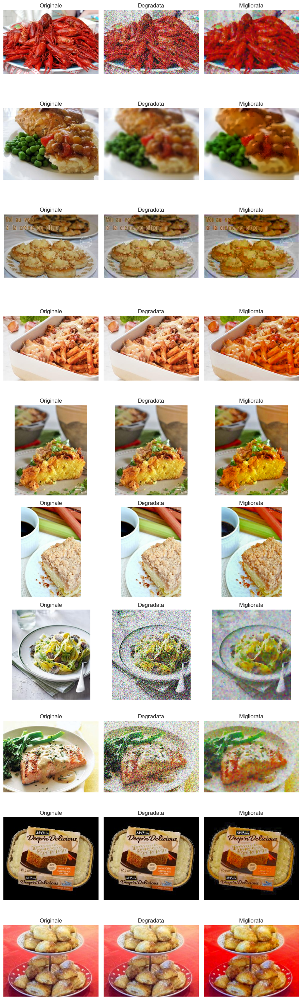

In [78]:
test_table_degradato = pd.read_csv(test_path, header=None, names=['image_id', 'label'])
test_dataset_degradato = ImageDataset(test_table_degradato, test_image_degradate, train=False)

test_table = pd.read_csv(test_path, header=None, names=['image_id', 'label'])
test_dataset = ImageDataset(test_table, test_image_no_degradate, train=False)

# Selezione casuale di 10 immagini
random_indices = random.sample(range(len(test_table)), 10)

fig, axes = plt.subplots(10, 3, figsize=(9, 30))

for i, idx in enumerate(random_indices):
    # Recupero immagine originale e degradata
    original_image = test_dataset.get_image_by_index(idx)
    degraded_image = test_dataset_degradato.get_image_by_index(idx)

    # Miglioramento dell'immagine degradata
    improved_image = image_improvement(degraded_image)

    # Plot delle immagini
    axes[i, 0].imshow(original_image)
    axes[i, 0].set_title("Originale")
    axes[i, 0].axis("off")

    axes[i, 1].imshow(degraded_image)
    axes[i, 1].set_title("Degradata")
    axes[i, 1].axis("off")

    axes[i, 2].imshow(improved_image)
    axes[i, 2].set_title("Migliorata")
    axes[i, 2].axis("off")

plt.tight_layout()
plt.show()

Sulla base dei risultati ottenuti, la nostra pipeline sembra funzionare in modo soddisfacente. Infatti, è in grado di migliorare le immagini caratterizzate da rumore, riuscendo a riconoscerle e ad applicare le correzioni necessarie. Al contrario, le immagini prive di rumore non subiscono alterazioni significative, dimostrando l'efficacia del sistema nel preservare la qualità delle immagini senza disturbi.

## Classificazione delle immagini rumorose

In [ ]:
models_names = ['resnet18', 'efficientnet','vgg16']
models_weights = [0.32075472, 0.33692722, 0.34231806]

### Performance Classificatore su Immagini Migliorate

In [2]:
from models.EnsambleModel import EnsambleModel

# modello preaddestrato su dati di train normali e dati di test ripuliti
train_df = pd.read_csv('./ground_truth/my_iterative_train.csv')
train_dataset = ImageDataset(train_df, './train_set/', train=True, deprecated=False)
test_df = pd.read_csv('./ground_truth/my_val_info.csv', header=None, names=['image', 'label'])
test_dataset = ImageDataset(test_df, './val_set/', train=False, deprecated=True)

em = EnsambleModel(models_name=models_names, pre_trained=True, models_weights=models_weights)
em.predict(test_dataset)

Epoch 1/10: 100%|██████████████████████| 141/141 [00:59<00:00,  2.38it/s, accuracy=0.012, loss=5.35] Train Accuracy: 0.0120 Validation Loss: 5.5018, Validation Accuracy: 0.0169 Epoch 2/10: 100%|█████████████████████| 141/141 [00:56<00:00,  2.48it/s, accuracy=0.0272, loss=5.42] Train Accuracy: 0.0272 Validation Loss: 5.3802, Validation Accuracy: 0.0428 Epoch 3/10: 100%|█████████████████████| 141/141 [00:56<00:00,  2.48it/s, accuracy=0.0599, loss=5.61] Train Accuracy: 0.0599 Validation Loss: 5.2627, Validation Accuracy: 0.0588 Epoch 4/10: 100%|█████████████████████| 141/141 [00:56<00:00,  2.48it/s, accuracy=0.0773, loss=5.24] Train Accuracy: 0.0773 Validation Loss: 5.1518, Validation Accuracy: 0.0784


### Performace Classificatore su immagini Migliorate e Addestrato su Immagini con Rumore

In [ ]:
# modello addestrato su dati di train puliti e ripuliti e dati di test ripuliti
train_dataset = ImageDataset(train_df, './train_set/', train=True, deprecated=True)
em = EnsambleModel(models_name=models_names, pre_trained=False)
em.train_ensamble(train_dataset, num_epochs=10, lr=0.0001)
em.predict(test_dataset)

### KNN